We have taken two different surfaces to try out the OMD algorithms using two different methods.
We check the behaviour according to the points mentioned below:
1. Different starting points (interior of the constraint, exterior of the constraint)
2. Box constraint and Circular constraint (both are convex)
3. Different $\eta_0$ and fixed and variable $\eta$
4. Different Bregman functions



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import jax.numpy as jnp
from jax import grad, jit, vmap
from jax import random
from jax import jacfwd, jacrev
import itertools
from scipy.optimize import minimize
from scipy.optimize import Bounds
from scipy import stats

## Bregman functions to be used

In [2]:
def l1(x):
    return np.sum(x**2)
def l2(x):
    return np.sum(x**4)
def l3(x):
    return (x[0]-2)**2+(x[1]-1)**2
def l4(x):
    return np.sum(x**3)
def l5(x):
    return max(np.sum(x),0)
def l6(x):
    return (np.sum(abs(x)))

In [3]:
def hessian(fun):
    return jit(jacfwd(jacrev(fun)))
def gradient(fn,x):
    x=np.array(x,dtype="float64")
    if fn==l1:
        return grad(l1)(x)
    elif fn==l2:
        return grad(l2)(x)
    elif fn==l5:
        return grad(l5)(x)

In [4]:
def f1(x):
    return 8*(x[0]-4)**2+(x[1]-5)**2
def f2(x):
    return (1-x[0])**2+(x[1]-x[0]**2)**2
def f3(x):
    return (x[0]-0.2)**2+(x[1]-0.8)**2

In [5]:
def breg_div(x):
    return l1(x)-l1(y)-(grad(l1)(y)).T@(x-y)

## Mirror descent with box constraints

### Method 1: We first take the descent step and then project it onto desired convex set using Bregman projection

In [8]:
def omd11(breg_fn,x1,cons,loss,lr,n,tol=1e-4,vlr=False):
    """
    breg_fn: A convex function used for bregman divergence
    x1: Starting point
    cons: Constraint (list input:[x1,x2,y1,y2]) (corner points of a box)
    loss: Surface to find minima on
    lr: learning rate
    n: Number of maximum iterations
    vlr: learning rate will be variable(decreasing) if set True, False by default
    """
    xi=np.array(x1,dtype="float32")
    loss_list=[]
    X=[xi]
    bounds=[(cons[0],cons[1]),(cons[2],cons[3])]
    y=np.array([0,0],dtype="float32")
    G=[]
    obj=[]
    steps=0
    obj_fun = lambda x: breg_fn(x)-breg_fn(y)-grad(breg_fn)(y)@(x-y)
    for i in range(10):
        loss_list.append(loss(xi))
        gi=grad(loss)(xi)
        G.append(np.linalg.norm(gi))
        if vlr:
            lr=lr/np.sqrt(i+1)
        xi-=lr*gi
        obj.append(obj_fun(xi))
        y=xi
        res = minimize(obj_fun, x0=xi, bounds=bounds)
        xi=res.x
        X.append(xi)
        steps+=1
    for i in range(n):
        if [abs(loss_list[len(loss_list)-k-1]-loss_list[len(loss_list)-k-2]) for k in range(len(loss_list)-1)]>[tol]:
            loss_list.append(loss(xi))
            gi=grad(loss)(xi)
            G.append(np.linalg.norm(gi))
            if vlr:
                lr=lr/np.sqrt(i+1)
            xi-=lr*gi
            obj.append(obj_fun(xi))
            y=xi
            res = minimize(obj_fun, x0=xi, bounds=bounds)
            xi=res.x
            X.append(xi)
            steps+=1
        else:
            break

    return {"points":X,"loss":loss,"loss_list":loss_list,"grad_norm":G,"obj":obj,"steps":steps}

In [11]:
cons=[0,5,0,6]
x0=np.array([-1,2])
res=omd11(l6,x0,cons,f1,0.01,200)

In [12]:
res["steps"]

205

In [13]:
res["points"]

[array([-1.,  2.], dtype=float32),
 array([0.        , 2.05999994]),
 array([0.63999999, 2.11879992]),
 array([1.17759991, 2.17642403]),
 array([1.62918389, 2.23289561]),
 array([2.0085144 , 2.28823781]),
 array([2.32715201, 2.34247303]),
 array([2.59480762, 2.39562368]),
 array([2.81963849, 2.44771123]),
 array([3.00849628, 2.49875689]),
 array([3.16713691, 2.54878163]),
 array([3.30039501, 2.59780598]),
 array([3.41233182, 2.64584994]),
 array([3.50635862, 2.69293284]),
 array([3.58534122, 2.73907423]),
 array([3.65168667, 2.7842927 ]),
 array([3.70741677, 2.82860684]),
 array([3.75423002, 2.87203479]),
 array([3.79355311, 2.91459417]),
 array([3.82658458, 2.9563024 ]),
 array([3.85433102, 2.99717641]),
 array([3.8776381 , 3.03723288]),
 array([3.89721608, 3.07648826]),
 array([3.91366148, 3.11495852]),
 array([3.92747569, 3.15265942]),
 array([3.93907952, 3.18960619]),
 array([3.94882679, 3.2258141 ]),
 array([3.95701456, 3.2612977 ]),
 array([3.96389222, 3.29607177]),
 array([3.969

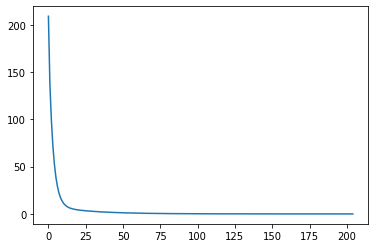

In [14]:
plt.plot(res["loss_list"])

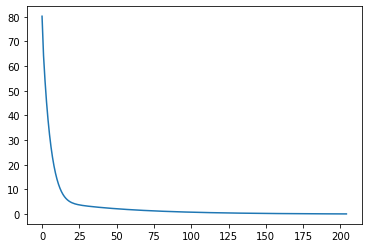

In [15]:
plt.plot(res['grad_norm'])

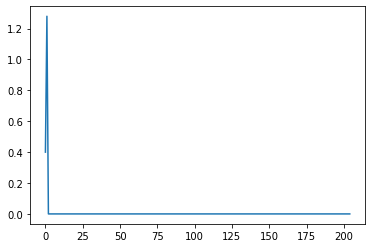

In [16]:
plt.plot(res['obj'])

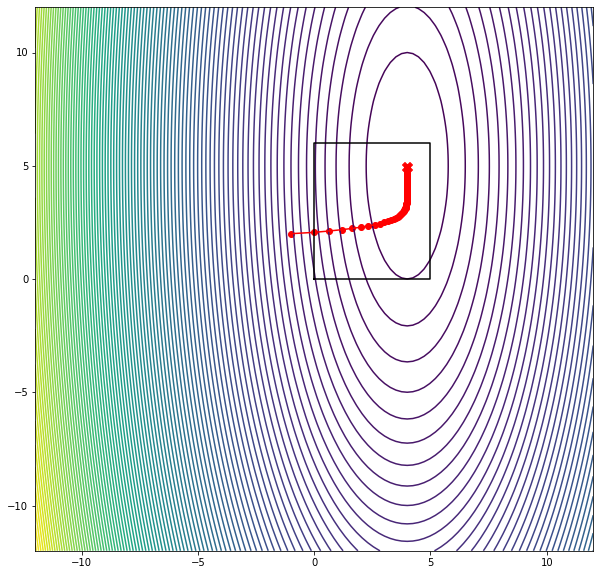

In [17]:
x=np.linspace(-12,12,100)
y=np.linspace(-12,12,100)
X,Y=np.meshgrid(x,y)


z=f1((X,Y))

resx=[a for (a,b) in res["points"]]
resy=[b for (a,b) in res["points"]]

plt.figure(figsize=(10,10))
plt.contour(X,Y,z,100)
plt.scatter(resx,resy,color="red")
plt.plot(resx,resy,color="red")
plt.plot([cons[0],cons[1],cons[1],cons[0],cons[0]],[cons[2],cons[2],cons[3],cons[3],cons[2]],color="black")
plt.scatter(resx[-1],resy[-1],marker="X",color="red",s=100)

### Method 2: Online mirror descent using Bregman divergence as regularizer

In [18]:
def omd12(breg_fn,x1,cons,loss,eta0,n,tol=1e-4,vlr=False):
    """
    breg_fn: A convex function used for bregman divergence
    x1: Starting point
    cons: Constraint (list input:[x1,x2,y1,y2]) (corner points of a box)
    loss: Surface to find minima on
    eta0: Penalty for Bregman divergence
    n: Number of maximum iterations(>10)
    vlr: Penalty will be variable(decreasing) if set True, False by default
    """
    xi=np.array(x1,dtype="float32")
    loss_list=[]
    X=[xi]
    bounds=Bounds([cons[0],cons[2]],[cons[1],cons[3]])
    y=np.array([0.,0.],dtype="float32")
    gi=np.array([0.,0.],dtype="float32")
    G=[]
    obj=[]
    steps=0
    obj_fun = lambda x: (breg_fn(x)-breg_fn(y)-grad(breg_fn)(y)@(x-y))/eta0+gi@x
    for i in range(10):
        gi=grad(loss)(xi)
        obj.append(obj_fun(xi))
        loss_list.append(loss(xi))
        G.append(np.linalg.norm(grad(obj_fun)(xi)))
        if vlr:
            eta0/=np.sqrt(i+1)
        y=xi
        res = minimize(obj_fun, x0=xi,method='trust-constr', jac=grad(obj_fun),hess=jit(jacfwd(jacrev(obj_fun))), bounds=bounds,)
        xi=res.x
        X.append(xi)
        steps+=1
    for i in range(n-10):
        if [abs(loss_list[len(loss_list)-k-1]-loss_list[len(loss_list)-k-2]) for k in range(len(loss_list)-1)]>[tol]:
            gi=grad(loss)(xi)
            obj.append(obj_fun(xi))
            loss_list.append(loss(xi))
            G.append(np.linalg.norm(grad(obj_fun)(xi)))
            if vlr:
                eta0/=np.sqrt(i+1)
            y=xi
            res = minimize(obj_fun, x0=xi,method='trust-constr', jac=grad(obj_fun),hess=jit(jacfwd(jacrev(obj_fun))), bounds=bounds,)
            xi=res.x
            X.append(xi)
            steps+=1
        else:
            break
    return {"points":X,"loss":loss,"loss_list":loss_list,"grad_norm":G,"obj":obj,"steps":steps}

In [19]:
cons=[0,7,0,7]
x0=np.array([1,2])
res=omd12(l1,x0,cons,f1,0.05,200,tol=1e-4)

In [20]:
res["steps"]

91

In [21]:
res["points"]

[array([1., 2.], dtype=float32),
 array([2.20011947, 2.15012304]),
 array([2.92007192, 2.29264459]),
 array([3.35216582, 2.42840645]),
 array([3.61129869, 2.55698997]),
 array([3.76677694, 2.67919392]),
 array([3.86004439, 2.79528801]),
 array([3.9160254 , 2.90552561]),
 array([3.94961386, 3.01025098]),
 array([3.96972876, 3.10977121]),
 array([3.98183489, 3.20428411]),
 array([3.98909897, 3.29407063]),
 array([3.99345923, 3.37936757]),
 array([3.99603197, 3.46040309]),
 array([3.99761748, 3.53738279]),
 array([3.99856841, 3.61051344]),
 array([3.99909758, 3.67997339]),
 array([3.99945655, 3.74597405]),
 array([3.9996726 , 3.80867424]),
 array([3.99977221, 3.8682179 ]),
 array([3.99985679, 3.9248015 ]),
 array([3.99988215, 3.97853101]),
 array([3.99988768, 4.02956044]),
 array([3.99993265, 4.07808202]),
 array([3.99995926, 4.12417778]),
 array([3.99994825, 4.16793102]),
 array([3.99992817, 4.20947456]),
 array([3.99992606, 4.24895209]),
 array([3.99993997, 4.28647742]),
 array([3.99994

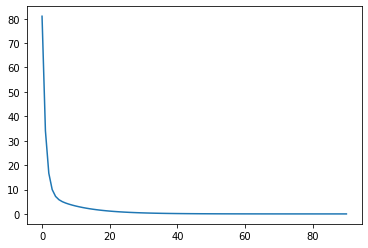

In [22]:
plt.plot(res["loss_list"])

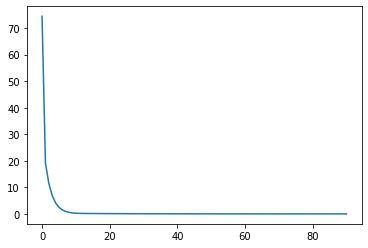

In [23]:
plt.plot(res['grad_norm'])

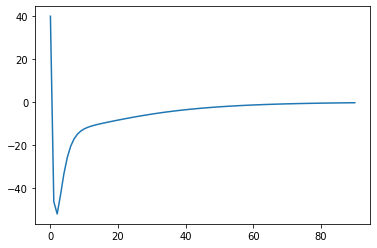

In [24]:
plt.plot(res['obj'])

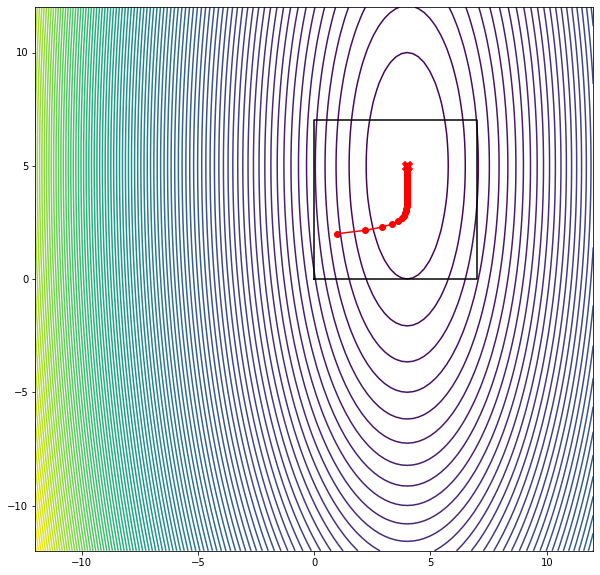

In [25]:
x=np.linspace(-12,12,100)
y=np.linspace(-12,12,100)
X,Y=np.meshgrid(x,y)


z=f1((X,Y))

resx=[a for (a,b) in res["points"]]
resy=[b for (a,b) in res["points"]]

plt.figure(figsize=(10,10))
plt.contour(X,Y,z,100)
plt.scatter(resx,resy,color="red")
plt.plot(resx,resy,color="red")
plt.plot([cons[0],cons[1],cons[1],cons[0],cons[0]],[cons[2],cons[2],cons[3],cons[3],cons[2]],color="black")
plt.scatter(resx[-1],resy[-1],marker="X",color="red",s=100)

## Mirror descent with non-linear constraints

### Method 1: We first take the descent step and then project it onto desired convex set using Bregman projection

In [26]:
def omd21(breg_fn,x1,xc,yc,r,loss,eta0,n,tol=1e-4,vlr=False):
    """
    breg_fn: A convex function used for bregman divergence
    x1: Starting point
    xc: x coordinate of the centre of the constraint
    yc: y coordinate of the centre of the constraint
    r= Radius of the constraint
    loss: Surface to find minima on
    eta0: learning rate
    n: Number of maximum iterations(>10)
    vlr: Penalty(eta0) will be variable(decreasing) if set True, False by default
    """
    xi=np.array(x1,dtype="float32")
    loss_list=[]
    X=[xi]
    cons = [{"type": "ineq", "fun": lambda x: -(x[0]-xc)**2-(x[1]-yc)**2+r**2}]
    y=np.array([0,0],dtype="float32")
    G=[]
    obj=[]
    obj_fun = lambda x: breg_fn(x)-breg_fn(y)-grad(breg_fn)(y)@(x-y)
    steps=0
    for i in range(10):
        loss_list.append(loss(xi))
        gi=grad(loss)(xi)
        obj.append(obj_fun(xi))
        xi-=eta0*gi
        G.append(np.linalg.norm(gi))
        if vlr:
            eta0/=np.sqrt(i+1)
        if (xi[0]-xc)**2+(xi[1]-yc)**2<=r**2:
            xi=xi
        else:
            y=xi
            res = minimize(obj_fun, x0=xi,constraints=cons)
            xi=res.x
        X.append(xi)
        steps+=1
    for i in range(n-10):
        if [abs(loss_list[len(loss_list)-k-1]-loss_list[len(loss_list)-k-2]) for k in range(len(loss_list)-1)]>[tol]:
            loss_list.append(loss(xi))
            gi=grad(loss)(xi)
            obj.append(obj_fun(xi))
            xi-=eta0*gi
            G.append(np.linalg.norm(gi))
            if vlr:
                eta0/=np.sqrt(i+1)
            if (xi[0]-xc)**2+(xi[1]-yc)**2<=r**2:
                xi=xi
            else:
                y=xi
                res = minimize(obj_fun, x0=xi,constraints=cons)
                xi=res.x
            X.append(xi)
            steps+=1
        else:
            break
    return {"points":X,"loss":loss,"loss_list":loss_list,"grad_norm":G,"obj":obj,"steps":steps}

In [27]:
xc=0
yc=0
r=7
x0=np.array([8,5])
res2=omd21(l1,x0,xc,yc,r,f1,0.1,30)

In [28]:
res2["points"]

[array([8., 5.], dtype=float32),
 DeviceArray([1.5999999, 5.       ], dtype=float32),
 array([4.68232376, 4.36396497]),
 DeviceArray([3.5906057, 4.491172 ], dtype=float32),
 DeviceArray([4.2456365, 4.5929375], dtype=float32),
 DeviceArray([3.8526182, 4.67435  ], dtype=float32),
 DeviceArray([4.088429, 4.73948 ], dtype=float32),
 DeviceArray([3.9469426, 4.791584 ], dtype=float32),
 DeviceArray([4.0318346, 4.833267 ], dtype=float32),
 DeviceArray([3.9808993, 4.866614 ], dtype=float32),
 DeviceArray([4.0114603, 4.893291 ], dtype=float32),
 DeviceArray([3.9931238, 4.914633 ], dtype=float32),
 DeviceArray([4.0041256, 4.9317064], dtype=float32),
 DeviceArray([3.9975247, 4.945365 ], dtype=float32),
 DeviceArray([4.0014853, 4.956292 ], dtype=float32),
 DeviceArray([3.9991088, 4.9650335], dtype=float32),
 DeviceArray([4.0005345, 4.972027 ], dtype=float32),
 DeviceArray([3.9996793, 4.9776216], dtype=float32),
 DeviceArray([4.0001926, 4.982097 ], dtype=float32),
 DeviceArray([3.9998844, 4.9856777

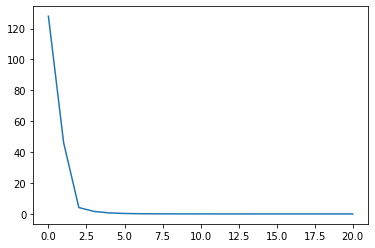

In [29]:
plt.plot(res2["loss_list"])

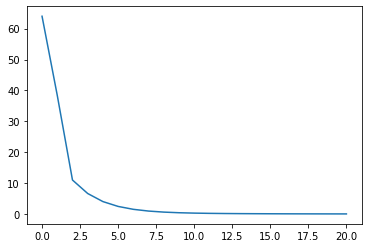

In [30]:
plt.plot(res2['grad_norm'])

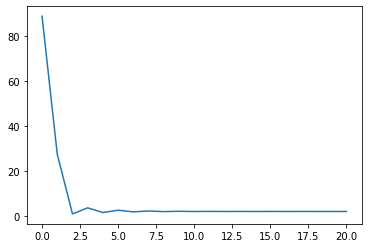

In [31]:
plt.plot(res2['obj'])

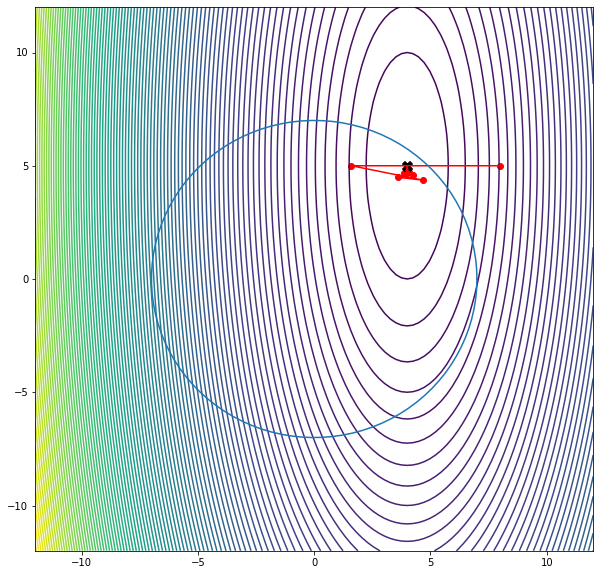

In [32]:
x=np.linspace(-12,12,100)
y=np.linspace(-12,12,100)
X,Y=np.meshgrid(x,y)

z=f1((X,Y))

res2x=[a for (a,b) in res2["points"]]
res2y=[b for (a,b) in res2["points"]]

theta=np.linspace(0,2*np.pi,100)
cx=xc+r*np.cos(theta)
cy=yc+r*np.sin(theta)

plt.figure(figsize=(10,10))
plt.contour(X,Y,z,100)
plt.scatter(res2x,res2y,color="red")
plt.plot(res2x,res2y,color="red")
plt.plot(cx,cy)
plt.Circle((1,2),3)
plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)

### Method 2: Online mirror descent using Bregman divergence regularizer

In [33]:
def omd22(breg_fn,x1,xc,yc,r,loss,eta0,n,tol=1e-4,vlr=False):
    """
    breg_fn: A convex function used for bregman divergence
    x1: Starting point
    xc: x coordinate of the centre of the constraint
    yc: y coordinate of the centre of the constraint
    r: Radius of the constraint
    loss: Surface to find minima on
    eta0: Penalty for bregman divergence term
    n: Number of maximum iterations(>10)
    vlr: Penalty(eta0) will be variable(decreasing) if set True, False by default
    """
    xi=np.array(x1,dtype="float32")
    loss_list=[]
    X=[xi]
    cons = [{"type": "ineq", "fun": lambda x: -(x[0]-xc)**2-(x[1]-yc)**2+r**2}]
    y=np.array([0,0],dtype="float32")
    gi=np.array([0,0],dtype="float32")
    G=[]
    obj=[]
    obj_fun = lambda x: (breg_fn(x)-breg_fn(y)-grad(breg_fn)(y)@(x-y))/eta0+gi@x
    steps=0
    for i in range(10):
        loss_list.append(loss(xi))
        gi=grad(loss)(xi)
        G.append(np.linalg.norm(gi))
        obj.append(obj_fun(xi))
        if vlr:
            eta0/=np.sqrt(i+1)
        y=xi
        res = minimize(obj_fun, x0=xi,method='trust-constr', jac=grad(obj_fun),hess=jit(jacfwd(jacrev(obj_fun))),constraints=cons)
        xi=res.x
        X.append(xi)
        steps+=1
    for i in range(n-10):
        if [abs(loss_list[len(loss_list)-k-1]-loss_list[len(loss_list)-k-2]) for k in range(len(loss_list)-1)]>[tol]:
            loss_list.append(loss(xi))
            gi=grad(loss)(xi)
            G.append(np.linalg.norm(gi))
            obj.append(obj_fun(xi))
            if vlr:
                eta0/=np.sqrt(i+1)
            y=xi
            res = minimize(obj_fun, x0=xi,method='trust-constr', jac=grad(obj_fun),hess=jit(jacfwd(jacrev(obj_fun))),constraints=cons)
            xi=res.x
            X.append(xi)
            steps+=1
        else:
            break
    return {"points":X,"loss":loss,"loss_list":loss_list,"grad_norm":G,"obj":obj,"steps":steps}

In [34]:
xc=0
yc=0
r=7
x0=np.array([8,5])
res2=omd22(l1,x0,xc,yc,r,f1,0.1,30)

/home/pratik/.local/lib/python3.8/site-packages/scipy/optimize/_hessian_update_strategy.py:182: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  warn('delta_grad == 0.0. Check if the approximated '


In [35]:
res2["points"]

[array([8., 5.], dtype=float32),
 array([4.79948534, 4.99946011]),
 array([4.1598947 , 4.99951135]),
 array([4.03197694, 4.99955797]),
 array([4.00638736, 4.999592  ]),
 array([4.00127603, 4.99963112]),
 array([4.00025521, 4.99966779]),
 array([4.00005125, 4.99970115]),
 array([4.00001009, 4.99973036]),
 array([4.00000065, 4.99975547]),
 array([3.99999981, 4.99977958])]

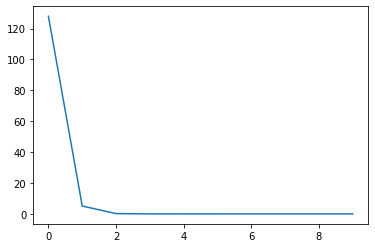

In [36]:
plt.plot(res2["loss_list"])

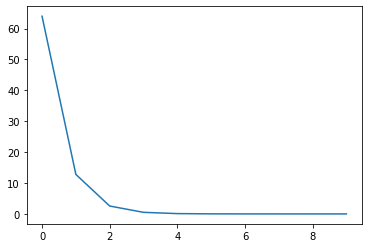

In [37]:
plt.plot(res2['grad_norm'])

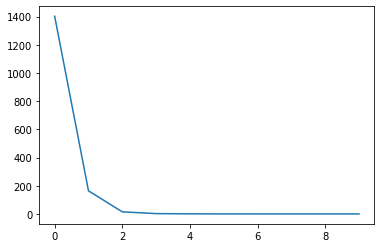

In [38]:
plt.plot(res2['obj'])

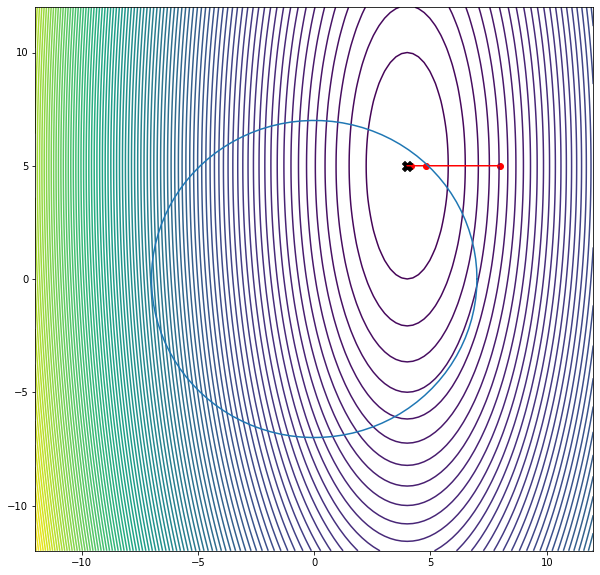

In [39]:
x=np.linspace(-12,12,100)
y=np.linspace(-12,12,100)
X,Y=np.meshgrid(x,y)

z=f1((X,Y))

res2x=[a for (a,b) in res2["points"]]
res2y=[b for (a,b) in res2["points"]]

theta=np.linspace(0,2*np.pi,100)
cx=xc+r*np.cos(theta)
cy=yc+r*np.sin(theta)

plt.figure(figsize=(10,10))
plt.contour(X,Y,z,100)
plt.scatter(res2x,res2y,color="red")
plt.plot(res2x,res2y,color="red")
plt.plot(cx,cy)
plt.Circle((1,2),3)
plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)

## Comparison plots

In [40]:
def comp_plot1(breg_fn,omd,x1,cons,loss,lr,n,tol=1e-4,vlr=False):
    """
    breg_fn: list of functions
    omd: omd function
    x1: list of starting points
    cons: list of constraints (list of lists)
    loss: list of loss functions
    lr: list of learning rates
    n: maximum iterations
    tol: tolerance of change
    vlr: valriable learning rate if set True
    """
    if len(breg_fn)>1:
        for i in range(len(breg_fn)):
            res=omd(breg_fn[i],x1[0],cons[0],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)


            z=loss[0]((X,Y))

            resx=[a for (a,b) in res["points"]]
            resy=[b for (a,b) in res["points"]]

            plt.figure(figsize=(15*len(breg_fn)/2,15))
            plt.subplot(2,len(breg_fn),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(resx,resy,color="red")
            plt.plot(resx,resy,color="red")
            plt.plot([cons[0][0],cons[0][1],cons[0][1],cons[0][0],cons[0][0]],[cons[0][2],cons[0][2],cons[0][3],cons[0][3],cons[0][2]],color="black")
            plt.scatter(resx[-1],resy[-1],marker="X",color="black",s=100)
            plt.title("Bregman function="+str(breg_fn[i])+"\n"+"steps="+str(res["steps"]))

    elif len(x1)>1:
        for i in range(len(x1)):
            res=omd(breg_fn[0],x1[i],cons[0],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)


            z=loss[0]((X,Y))

            resx=[a for (a,b) in res["points"]]
            resy=[b for (a,b) in res["points"]]

            plt.figure(figsize=(15*len(x1)/2,15))
            plt.subplot(2,len(x1),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(resx,resy,color="red")
            plt.plot(resx,resy,color="red")
            plt.plot([cons[0][0],cons[0][1],cons[0][1],cons[0][0],cons[0][0]],[cons[0][2],cons[0][2],cons[0][3],cons[0][3],cons[0][2]],color="black")
            plt.scatter(resx[-1],resy[-1],marker="X",color="black",s=100)
            plt.title("Starting point="+str(x1[i])+"\n"+"steps="+str(res["steps"]))

    elif len(cons)>1:
        for i in range(len(cons)):
            res=omd(breg_fn[0],x1[0],cons[i],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)


            z=loss[0]((X,Y))

            resx=[a for (a,b) in res["points"]]
            resy=[b for (a,b) in res["points"]]

            plt.figure(figsize=(15*len(cons)/2,15))
            plt.subplot(2,len(cons),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(resx,resy,color="red")
            plt.plot(resx,resy,color="red")
            plt.plot([cons[i][0],cons[i][1],cons[i][1],cons[i][0],cons[i][0]],[cons[i][2],cons[i][2],cons[i][3],cons[i][3],cons[i][2]],color="black")
            plt.scatter(resx[-1],resy[-1],marker="X",color="black",s=100)
            plt.title("Constraint="+str(cons[i])+"\n"+"steps="+str(res["steps"]))

    elif len(loss)>1:
        for i in range(len(loss)):
            res=omd(breg_fn[0],x1[0],cons[0],loss[i],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)


            z=loss[i]((X,Y))

            resx=[a for (a,b) in res["points"]]
            resy=[b for (a,b) in res["points"]]

            plt.figure(figsize=(15*len(loss)/2,15))
            plt.subplot(2,len(loss),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(resx,resy,color="red")
            plt.plot(resx,resy,color="red")
            plt.plot([cons[0][0],cons[0][1],cons[0][1],cons[0][0],cons[0][0]],[cons[0][2],cons[0][2],cons[0][3],cons[0][3],cons[0][2]],color="black")
            plt.scatter(resx[-1],resy[-1],marker="X",color="black",s=100)
            plt.title("Loss function="+str(loss[i])+"\n"+"steps="+str(res["steps"]))

    elif len(lr)>1:
        for i in range(len(lr)):
            res=omd(breg_fn[0],x1[0],cons[0],loss[0],lr[i],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)


            z=loss[0]((X,Y))

            resx=[a for (a,b) in res["points"]]
            resy=[b for (a,b) in res["points"]]

            plt.figure(figsize=(15*len(lr)/2,15))
            plt.subplot(2,len(lr)//2,i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(resx,resy,color="red")
            plt.plot(resx,resy,color="red")
            plt.plot([cons[0][0],cons[0][1],cons[0][1],cons[0][0],cons[0][0]],[cons[0][2],cons[0][2],cons[0][3],cons[0][3],cons[0][2]],color="black")
            plt.scatter(resx[-1],resy[-1],marker="X",color="black",s=100)
            plt.title("Learning rate="+str(lr[i])+"\n"+"steps="+str(res["steps"]))

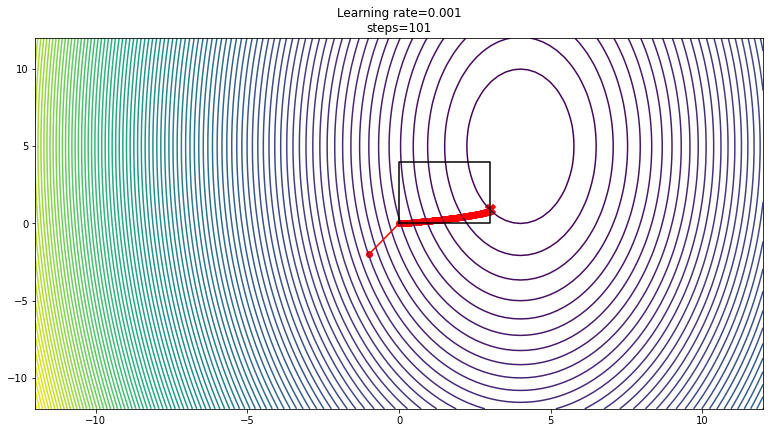

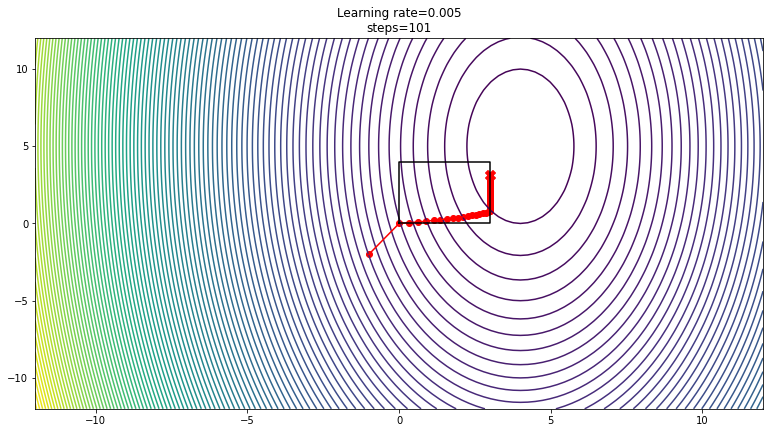

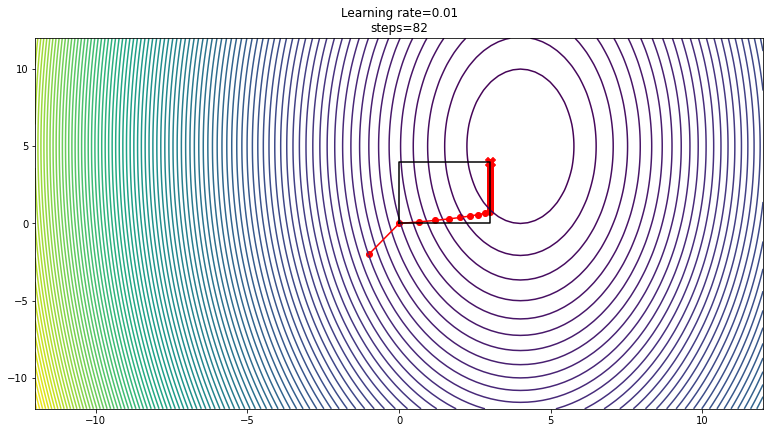

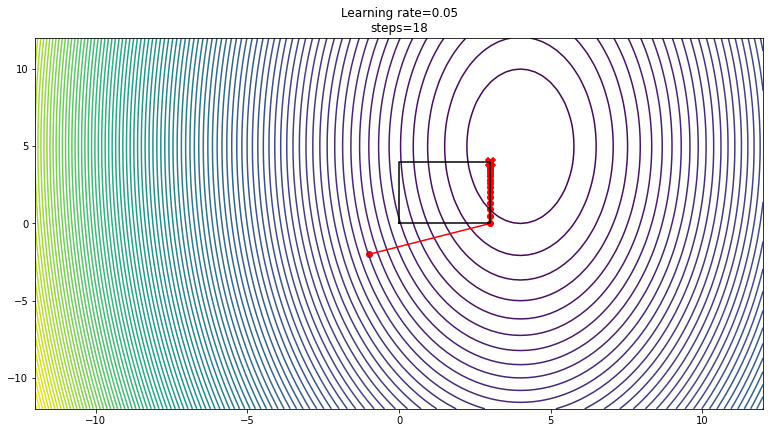

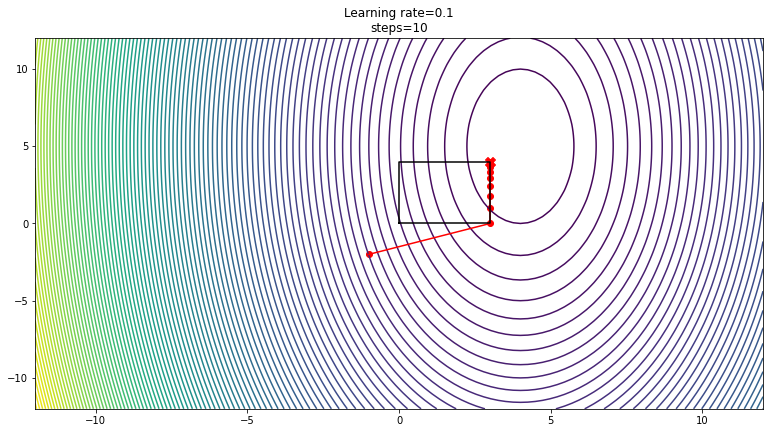

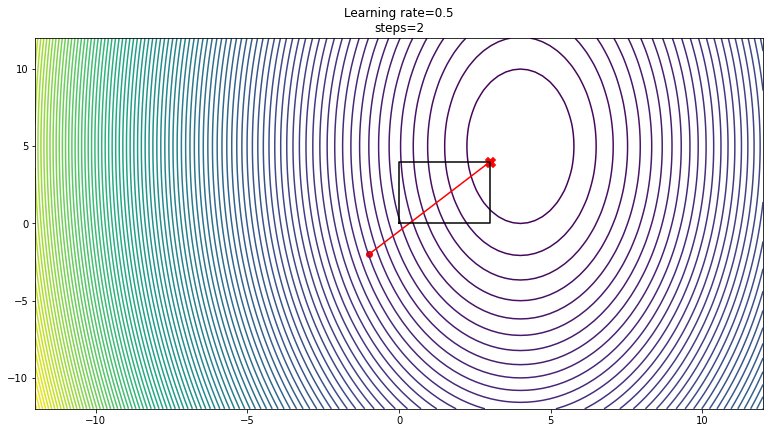

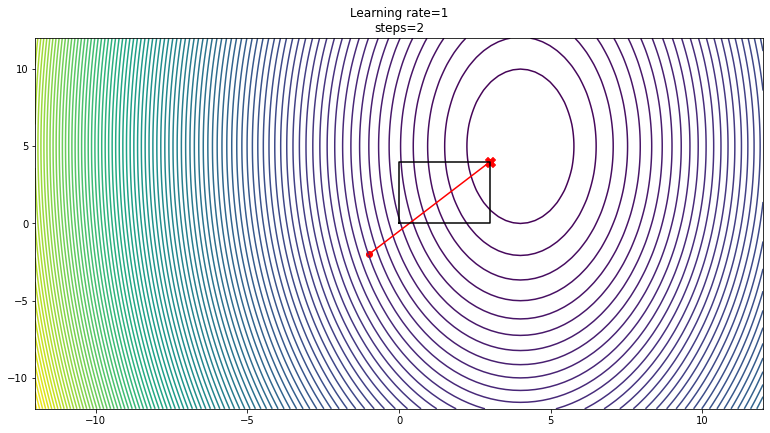

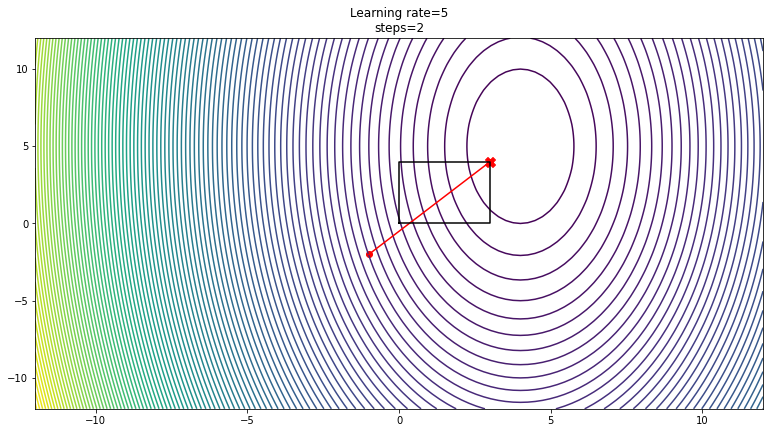

In [86]:
x1=[np.array([-1,-2])]
cons=[[0,3,0,4]]
lr=[0.001,0.005,0.01,0.05,0.1,0.5,1,5]
comp_plot1([l1],omd11,x1,cons,[f1],lr,100,tol=1e-4,vlr=False)

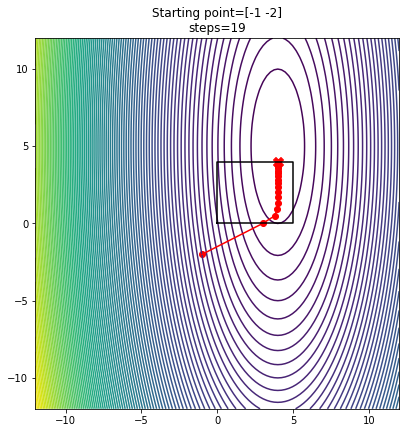

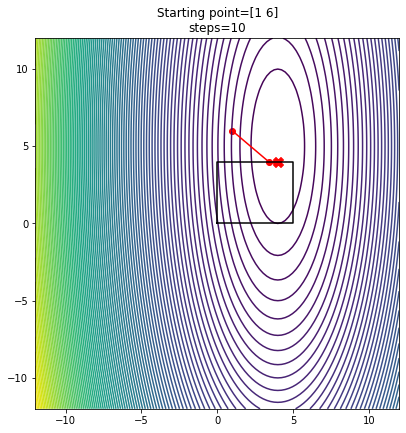

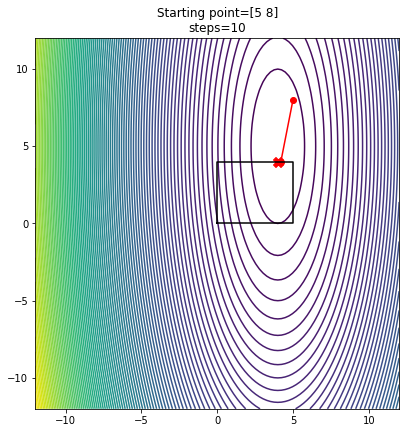

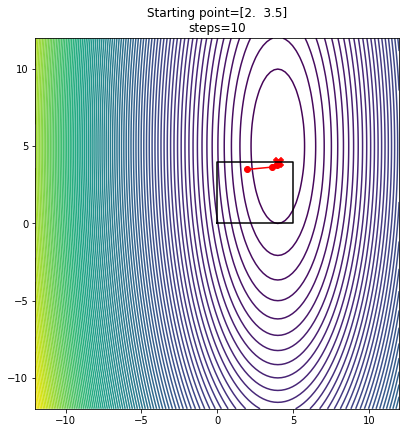

In [185]:
x1=[np.array([-1,-2]),np.array([1,6]),np.array([5,8]),np.array([2,3.5])]
cons=[[0,5,0,4]]
eta0=[0.1]
comp_plot1([l1],omd12,x1,cons,[f1],eta0,20,tol=1e-4,vlr=False)

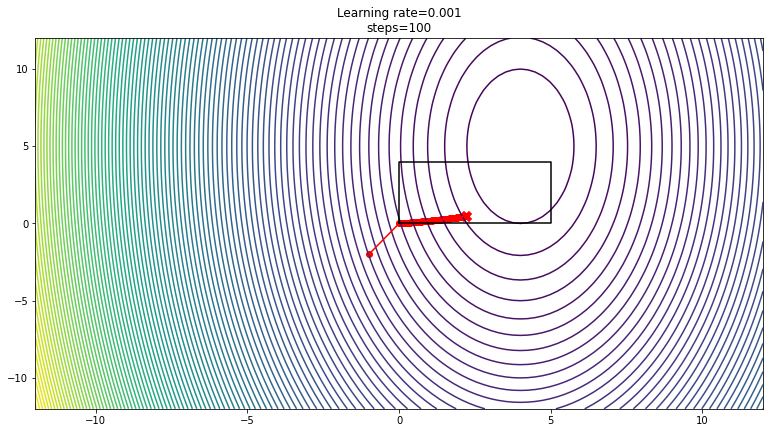

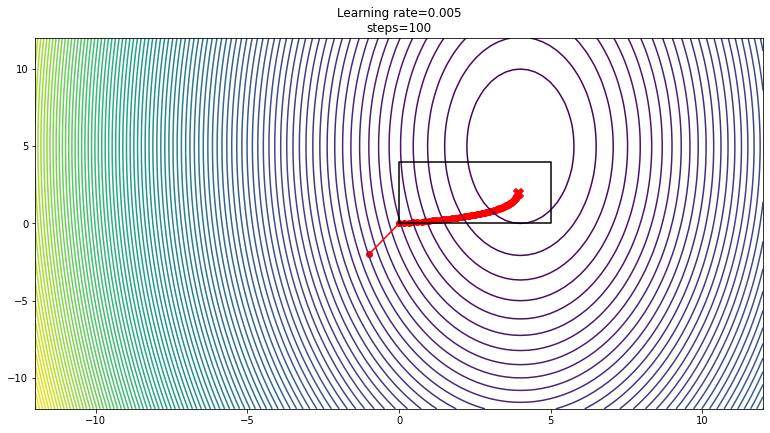

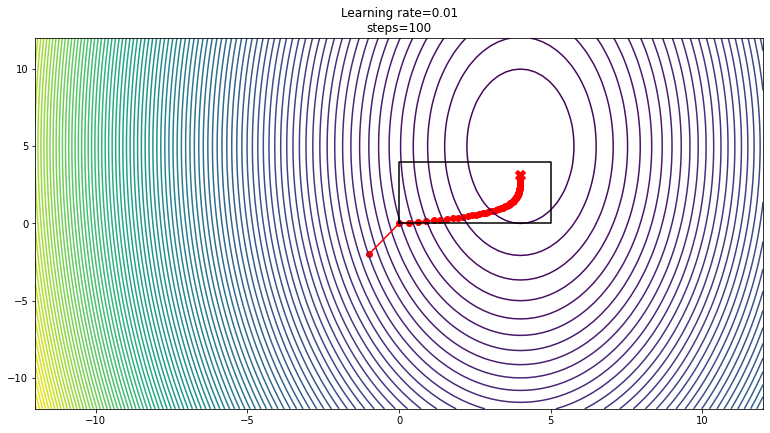

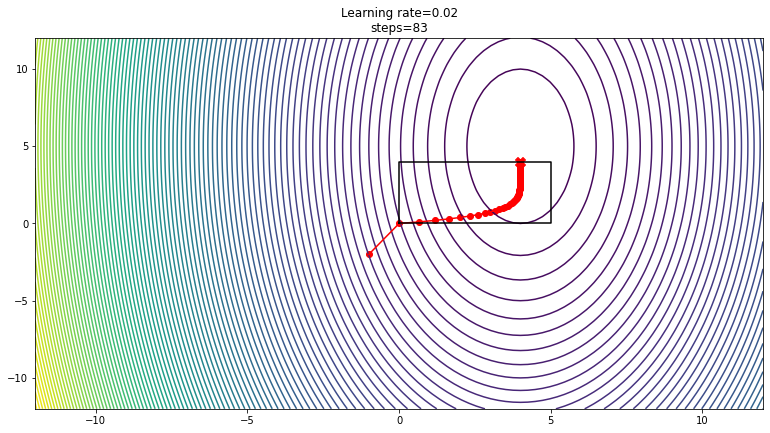

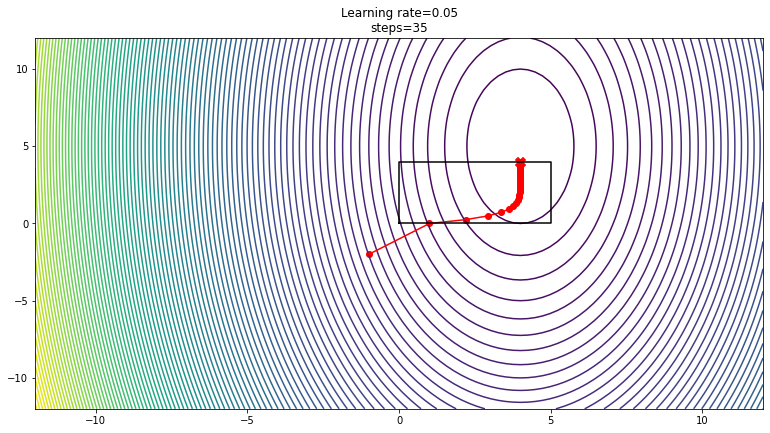

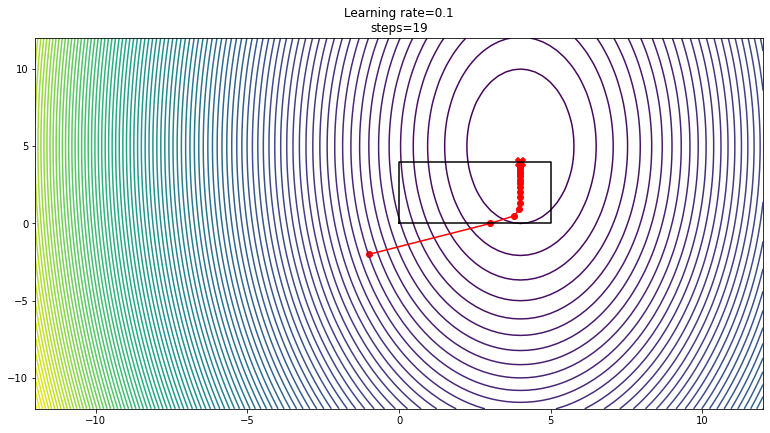

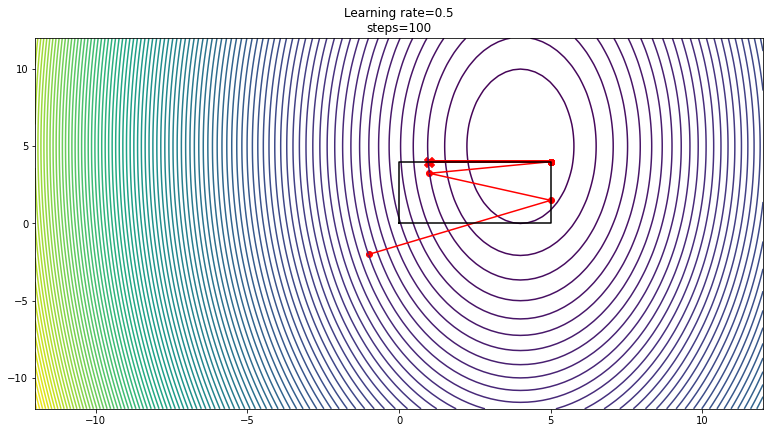

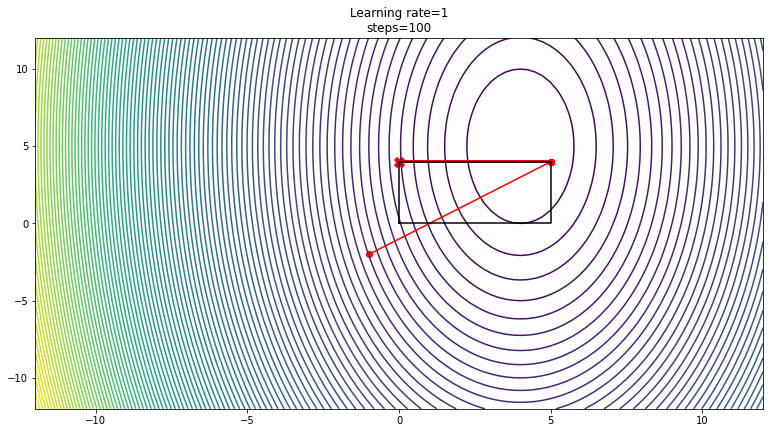

In [193]:
x1=[np.array([-1,-2])]
cons=[[0,5,0,4]]
eta0=[0.001,0.005,0.01,0.02,0.05,0.1,0.5,1]
comp_plot1([l1],omd12,x1,cons,[f1],eta0,100,tol=1e-4,vlr=False)

In [187]:
def comp_plot2(breg_fn,omd,x1,cons,loss,lr,n,tol=1e-4,vlr=False):
    """
    breg_fn: list of functions
    omd: omd function
    x1: list of starting points
    cons: list of constraints (list of lists)
    loss: list of loss functions
    lr: list of learning rates
    n: maximum iterations
    tol: tolerance of change
    vlr: valriable learning rate if set True
    """
    if len(breg_fn)>1:
        for i in range(len(breg_fn)):
            res2=omd(breg_fn[i],x1[0],cons[0][0],cons[0][1],cons[0][2],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)

            z=loss[0]((X,Y))

            res2x=[a for (a,b) in res2["points"]]
            res2y=[b for (a,b) in res2["points"]]

            theta=np.linspace(0,2*np.pi,100)
            cx=cons[0][0]+cons[0][2]*np.cos(theta)
            cy=cons[0][1]+cons[0][2]*np.sin(theta)

            plt.figure(figsize=(15*len(breg_fn)/2,15))
            plt.subplot(2,len(breg_fn),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(res2x,res2y,color="red")
            plt.plot(res2x,res2y,color="red")
            plt.plot(cx,cy)
            plt.Circle((cons[0][0],cons[0][1]),cons[0][2])
            plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)
            plt.title("Bregman function="+str(breg_fn[i])+"\n"+"steps="+str(res2["steps"]))
    elif len(x1)>1:
        for i in range(len(x1)):
            res2=omd(breg_fn[0],x1[i],cons[0][0],cons[0][1],cons[0][2],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)

            z=loss[0]((X,Y))

            res2x=[a for (a,b) in res2["points"]]
            res2y=[b for (a,b) in res2["points"]]

            theta=np.linspace(0,2*np.pi,100)
            cx=cons[0][0]+cons[0][2]*np.cos(theta)
            cy=cons[0][1]+cons[0][2]*np.sin(theta)

            plt.figure(figsize=(15*len(x1)/2,15))
            plt.subplot(2,len(x1),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(res2x,res2y,color="red")
            plt.plot(res2x,res2y,color="red")
            plt.plot(cx,cy)
            plt.Circle((cons[0][0],cons[0][1]),cons[0][2])
            plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)
            plt.title("Starting point="+str(x1[i])+"\n"+"steps="+str(res2["steps"]))
    elif len(cons)>1:
        for i in range(len(cons)):
            res2=omd(breg_fn[0],x1[0],cons[i][0],cons[i][1],cons[i][2],loss[0],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)

            z=loss[0]((X,Y))

            res2x=[a for (a,b) in res2["points"]]
            res2y=[b for (a,b) in res2["points"]]

            theta=np.linspace(0,2*np.pi,100)
            cx=cons[i][0]+cons[i][2]*np.cos(theta)
            cy=cons[i][1]+cons[i][2]*np.sin(theta)

            plt.figure(figsize=(15*len(cons)/2,15))
            plt.subplot(2,len(cons),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(res2x,res2y,color="red")
            plt.plot(res2x,res2y,color="red")
            plt.plot(cx,cy)
            plt.Circle((cons[i][0],cons[i][1]),cons[i][2])
            plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)
            plt.title("Constraint="+str(cons[i])+"\n"+"steps="+str(res2["steps"]))
    elif len(loss)>1:
        for i in range(len(loss)):
            res2=omd(breg_fn[0],x1[0],cons[0][0],cons[0][1],cons[0][2],loss[i],lr[0],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)

            z=loss[i]((X,Y))

            res2x=[a for (a,b) in res2["points"]]
            res2y=[b for (a,b) in res2["points"]]

            theta=np.linspace(0,2*np.pi,100)
            cx=cons[0][0]+cons[0][2]*np.cos(theta)
            cy=cons[0][1]+cons[0][2]*np.sin(theta)

            plt.figure(figsize=(15*len(loss)/2,15))
            plt.subplot(2,len(loss),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(res2x,res2y,color="red")
            plt.plot(res2x,res2y,color="red")
            plt.plot(cx,cy)
            plt.Circle((cons[0][0],cons[0][1]),cons[0][2])
            plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)
            plt.title("Loss function="+str(loss[i])+"\n"+"steps="+str(res2["steps"]))
    elif len(lr)>1:
        for i in range(len(lr)):
            res2=omd(breg_fn[0],x1[0],cons[0][0],cons[0][1],cons[0][2],loss[0],lr[i],n,tol=tol,vlr=vlr)
            x=np.linspace(-12,12,100)
            y=np.linspace(-12,12,100)
            X,Y=np.meshgrid(x,y)

            z=loss[0]((X,Y))

            res2x=[a for (a,b) in res2["points"]]
            res2y=[b for (a,b) in res2["points"]]

            theta=np.linspace(0,2*np.pi,100)
            cx=cons[0][0]+cons[0][2]*np.cos(theta)
            cy=cons[0][1]+cons[0][2]*np.sin(theta)

            plt.figure(figsize=(15*len(lr)/2,15))
            plt.subplot(2,len(lr),i+1)
            plt.contour(X,Y,z,100)
            plt.scatter(res2x,res2y,color="red")
            plt.plot(res2x,res2y,color="red")
            plt.plot(cx,cy)
            plt.Circle((cons[0][0],cons[0][1]),cons[0][2])
            plt.scatter(res2x[-1],res2y[-1],marker="X",color="black",s=100)
            plt.title("Learning rate="+str(lr[i])+"\n"+"steps="+str(res2["steps"]))

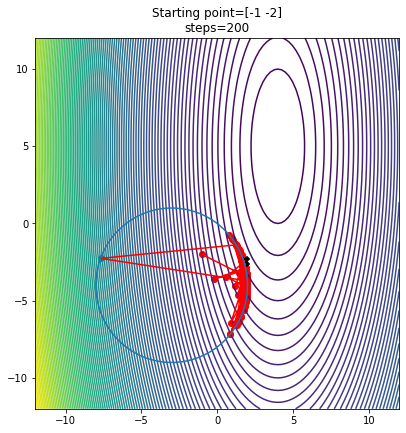

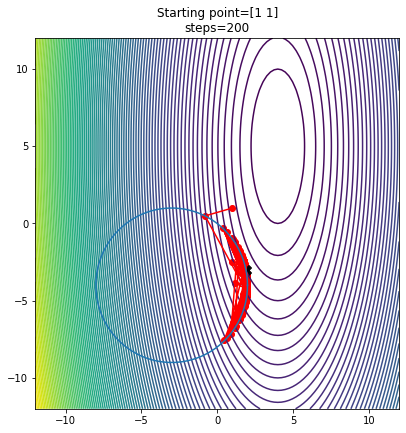

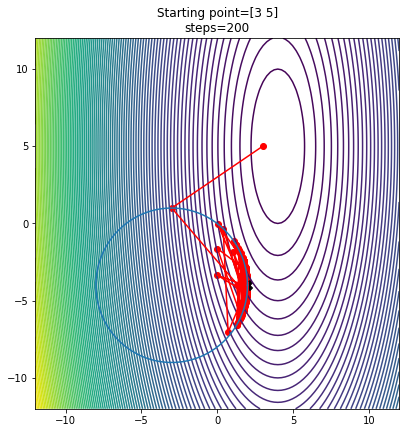

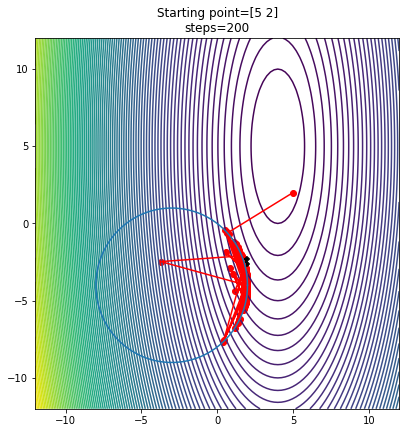

In [189]:
x1=[np.array([-1,-2]),np.array([1,1]),np.array([3,5]),np.array([5,2])]
cons=[[-3,-4,5]]
lr=[0.1]
comp_plot2([l1],omd=omd21,x1=x1,cons=cons,loss=[f1],lr=lr,n=200,tol=1e-4)

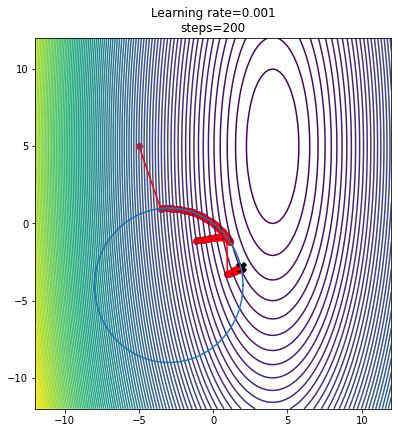

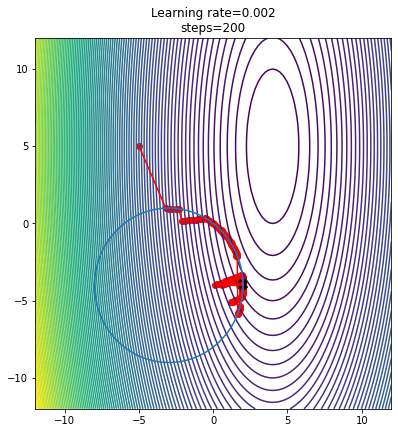

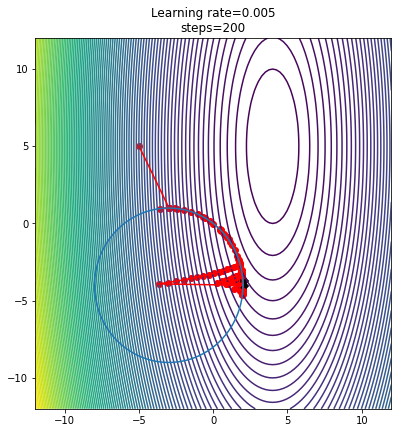

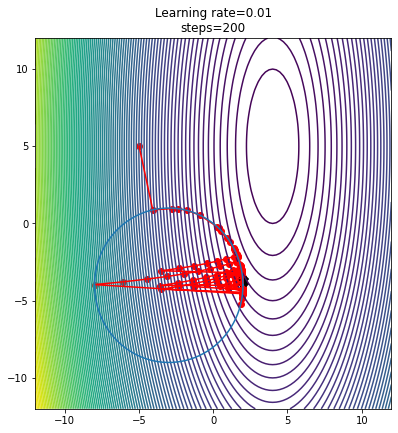

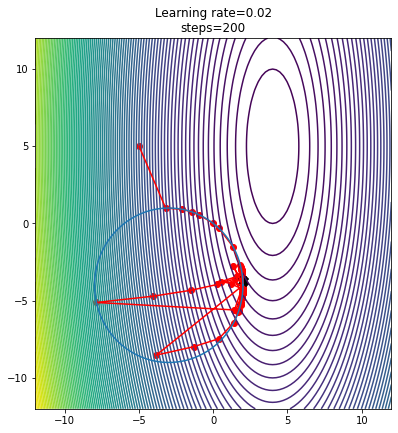

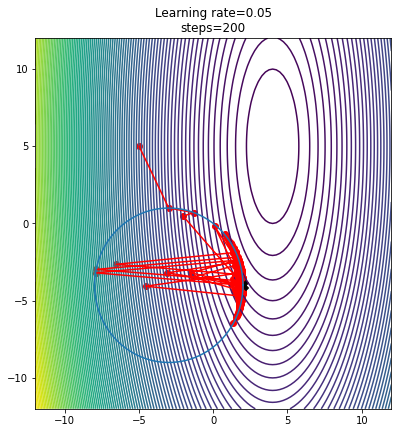

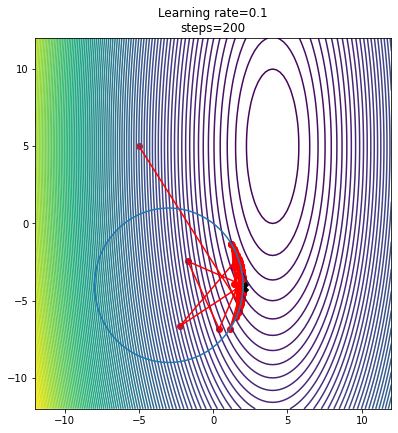

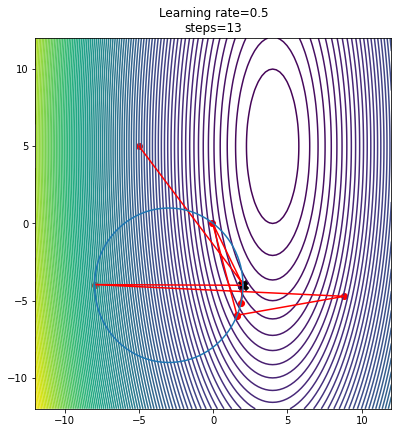

In [190]:
x1=[np.array([-5,5])]
cons=[[-3,-4,5]]
lr=[0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.5]
comp_plot2([l1],omd=omd21,x1=x1,cons=cons,loss=[f1],lr=lr,n=200,tol=1e-4)

In [6]:
def l(x):
    return(-np.product(x)+(1/len(x))**len(x))

In [7]:
def V_set(x):
    M=np.array([np.exp(x)/sum(np.exp(x)),x**4/np.sum(x**4),x**6/np.sum(x**6),abs(x)/np.sum(x),abs(np.sin(x))/np.sum(abs(np.sin(x)))])
    return M
    
                                           
def exp_adv2(x1,f,n,eta0):
    """
    x1: Initial probability distribution
    f: Loss function
    n: Number of maximum iterations
    eta0: Learning rate
    """
    p=x1
    loss_list=[]
    regret_list=[]
    P=[p]
    grad_list=[]
    reg=0
    for k in range(n):
        a=np.random.randn(*x1.shape)
        exps=V_set(a)
        i=np.random.randint(len(exps))
        expert=exps[i]
        loss=f(p)
        gi=grad(f)(p)
        grad_list.append(gi)
        reg=sum([g@p for g,p in zip(grad_list,P)])-sum([g@expert for g in grad_list])
        regret_list.append(reg)
        loss_list.append(loss)
        p=p*np.exp(-eta0*gi)/sum(p*np.exp(-eta0*gi))
        P.append(p)
        print(p)
    return{"loss_list":loss_list,"points":P,"regret":regret_list}

In [8]:
def exp_adv1(x1,f,n,eta0):
    """
    x1: Initial probability distribution
    f: Loss function
    n: Number of maximum iterations
    eta0: Learning rate
    """
    exps=np.eye(len(x1))
    xk=np.arange(len(x1))
    p=x1
    loss_list=[]
    regret=[]
    P=[p]
    grad_list=[]
    reg=0
    for k in range(n):
        dist=stats.rv_discrete(name='dist',values=(xk,p))
        i=dist.rvs(size=1)
        expert=exps[int(i)]
        loss=f(p)
        gi=grad(f)(p)
        grad_list.append(gi)
        reg=sum([g@p for g,p in zip(grad_list,P)])-sum([g@expert for g in grad_list])
        regret.append(reg)
        loss_list.append(loss)
        p=p*np.exp(-eta0*gi)/sum(p*np.exp(-eta0*gi))
        P.append(p)
        print(p)
    return{"loss_list":loss_list,"points":P,"regret":regret}


In [1]:
def exp_adv3(x1,f,n,eta0,eps=0.05):
    """
    x1: Initial probability distribution
    f: Loss function
    n: Number of maximum iterations
    eta0: Learning rate
    eps: Amount of perturbation to add to p (decides amount of randomization in expert)
    """
    xk=np.arange(len(x1))
    p=x1
    loss_list=[]
    regret_list=[]
    P=[p]
    grad_list=[]
    reg=0
    for k in range(n):
        a=p+eps*np.random.randn(*x1.shape)
        exps=V_set(a)
        dist=stats.rv_discrete(name='dist',values=(xk,p))
        i=int(dist.rvs(size=1))%5
        expert=exps[i]
        loss=f(p)
        gi=grad(f)(p)
        grad_list.append(gi)
        reg=sum([g@p for g,p in zip(grad_list,P)])-sum([g@expert for g in grad_list])
        regret_list.append(reg)
        loss_list.append(loss)
        p=p*np.exp(-eta0*gi)/sum(p*np.exp(-eta0*gi))
        P.append(p)
        print(p)
    return{"loss_list":loss_list,"points":P,"regret":regret_list}

In [10]:
def exp_adv4(x1,breg_fn,f,n,eta0):
    """
    x1: Initial probability distribution
    f: Loss function
    n: Number of maximum iterations
    eta0: Learning rate
    """
    exps=np.eye(len(x1))
    xk=np.arange(len(x1))
    p=x1
    cons = [{"type": "eq", "fun": lambda x: np.sum(x)-1}]
    loss_list=[]
    regret=[]
    P=[p]
    grad_list=[]
    reg=0
    y=np.random.randn(len(p))
    y=np.exp(y)/sum(np.exp(y))
    gi=np.zeros(len(p),dtype="float32")
    obj=[]
    obj_fun = lambda x: (breg_fn(x)-breg_fn(y)-grad(breg_fn)(y)@(x-y))/eta0+gi@x
    for k in range(n):
        dist=stats.rv_discrete(name='dist',values=(xk,p))
        i=dist.rvs(size=1)
        expert=exps[int(i)]
        loss=f(p)
        gi=grad(f)(p)
        obj.append(obj_fun(p))
        grad_list.append(gi)
        reg=sum([g@p for g,p in zip(grad_list,P)])-sum([g@expert for g in grad_list])
        regret.append(reg)
        loss_list.append(loss)
        y=p
        opt = minimize(obj_fun, x0=p,method='trust-constr', jac=grad(obj_fun),hess=jit(jacfwd(jacrev(obj_fun))),constraints=cons, bounds=[(0, 1)] * len(p))
        p=opt.x
        P.append(p)
        print(p)
    return{"loss_list":loss_list,"points":P,"regret":regret}

In [46]:
x1=np.array([0.1,0.2,0.3,0.4])
n=50
eta0=3
resx4=exp_adv4(x1,l6,l,n,eta0)

/home/pratik/.local/lib/python3.8/site-packages/scipy/optimize/_hessian_update_strategy.py:182: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  warn('delta_grad == 0.0. Check if the approximated '


[0.30079489 0.23577156 0.22912094 0.23431262]
[0.24243032 0.25172002 0.25371531 0.25213435]
[0.2438252  0.2514029  0.25303092 0.25174099]
[0.24804696 0.25044066 0.25096342 0.25054897]
[0.24925686 0.25016741 0.25036699 0.25020875]
[0.24981024 0.25004272 0.25009379 0.25005325]
[0.24984516 0.25003485 0.25007654 0.25004345]
[0.24995074 0.2500111  0.25002433 0.25001384]
[0.24998123 0.25000424 0.25000926 0.25000527]
[0.24999286 0.2500016  0.25000354 0.250002  ]
[0.24999727 0.25000062 0.25000135 0.25000076]
[0.24999778 0.25000051 0.2500011  0.25000061]
[0.24999916 0.25000019 0.25000042 0.25000023]
[0.24999969 0.25000009 0.25000016 0.25000007]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 0.25000003]
[0.24999983 0.25000005 0.25000009 

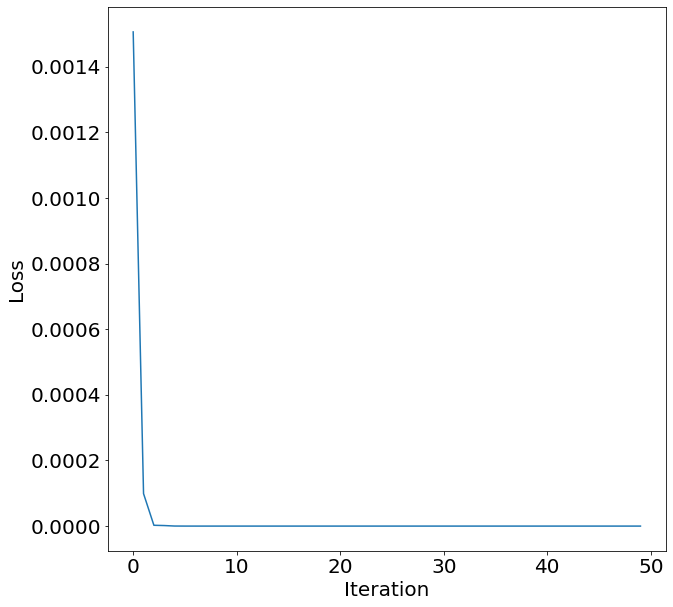

In [47]:
plt.figure(figsize=(10,10))
plt.plot(resx4["loss_list"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

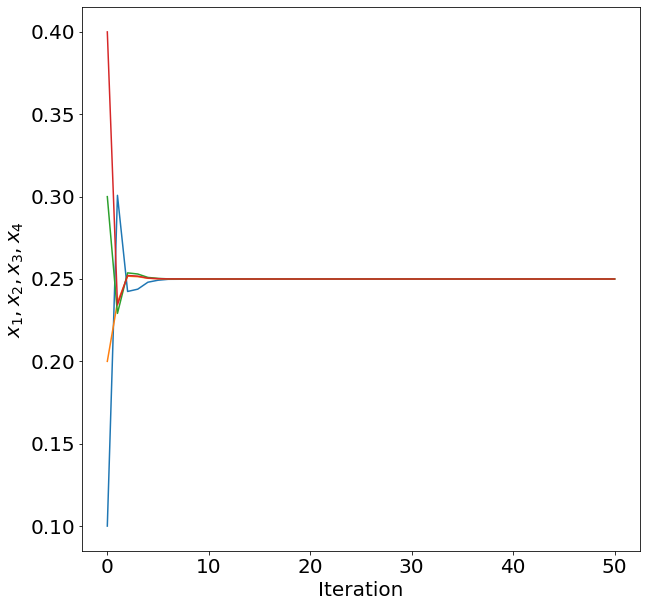

In [48]:
plt.figure(figsize=(10,10))
plt.plot(resx4["points"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('$x_1,x_2,x_3,x_4$',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

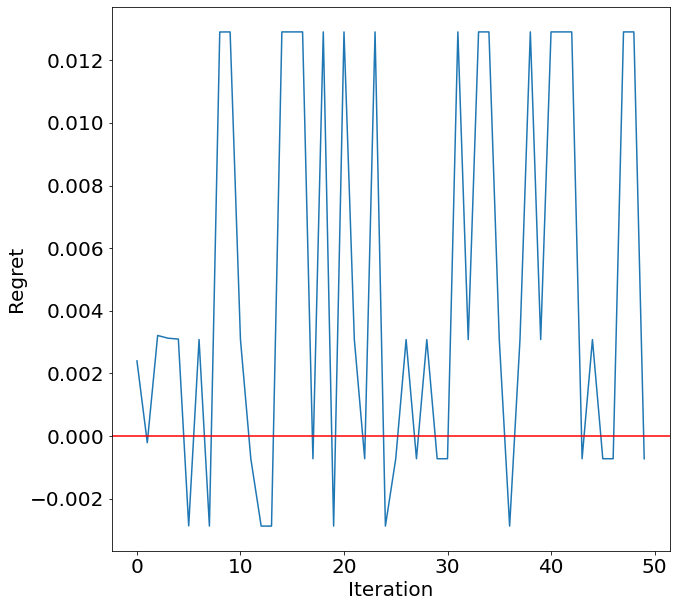

In [49]:
plt.figure(figsize=(10,10))
plt.plot(resx4["regret"])
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

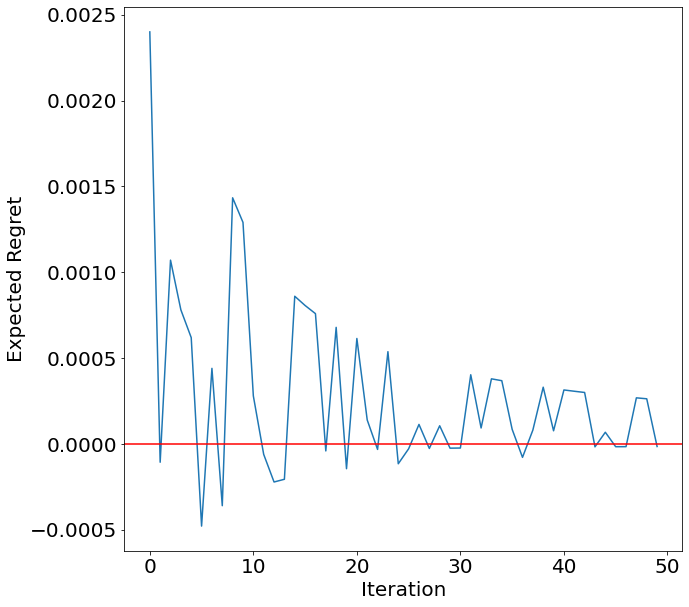

0.00049959327

In [50]:
plt.figure(figsize=(10,10))
reg_exp4=[resx4["regret"][i]/(i+1) for i in range(len(resx4["regret"]))]
plt.plot(reg_exp4)
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Expected Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

np.std(reg_exp4)

In [51]:
x1=np.array([0.1,0.2,0.3,0.4])
n=800
eta0=3
resx1=exp_adv1(x1,l,n,eta0)

[0.10440146 0.20141969 0.29852567 0.39565317]
[0.10881898 0.20284772 0.29704606 0.39128724]
[0.1132399  0.20427995 0.29556545 0.3869147 ]
[0.11765184 0.20571237 0.29408799 0.38254779]
[0.1220428  0.20714103 0.29261775 0.37819842]
[0.12640127 0.2085621  0.29115862 0.373878  ]
[0.1307164  0.20997195 0.28971423 0.36959741]
[0.13497806 0.21136714 0.28828803 0.36536677]
[0.13917691 0.21274448 0.28688314 0.36119548]
[0.14330447 0.21410105 0.28550236 0.35709212]
[0.14735316 0.2154342  0.28414832 0.35306431]
[0.15131633 0.21674155 0.28282319 0.34911893]
[0.15518821 0.21802106 0.28152889 0.34526185]
[0.15896392 0.21927092 0.28026708 0.34149808]
[0.16263948 0.22048962 0.27903911 0.33783179]
[0.1662117  0.22167594 0.277846   0.33426636]
[0.1696782  0.2228289  0.27668854 0.33080436]
[0.17303728 0.2239478  0.27556728 0.32744764]
[0.17628795 0.22503211 0.27448252 0.32419742]
[0.17942981 0.22608156 0.27343438 0.32105425]
[0.18246302 0.227096   0.27242279 0.31801818]
[0.1853882  0.22807557 0.27144753 

[0.24996758 0.24998883 0.25001069 0.2500329 ]
[0.2499691  0.24998935 0.25001018 0.25003137]
[0.24997053 0.24998985 0.25000971 0.2500299 ]
[0.24997192 0.24999032 0.25000925 0.2500285 ]
[0.24997324 0.24999076 0.25000883 0.25002717]
[0.24997449 0.24999119 0.25000841 0.2500259 ]
[0.2499757  0.2499916  0.25000802 0.25002468]
[0.24997682 0.24999201 0.25000764 0.25002353]
[0.24997791 0.24999239 0.25000728 0.25002243]
[0.24997894 0.24999274 0.25000695 0.25002136]
[0.24997994 0.24999306 0.25000664 0.25002037]
[0.24998086 0.24999338 0.25000633 0.25001944]
[0.24998174 0.2499937  0.25000603 0.25001853]
[0.24998261 0.24999399 0.25000575 0.25001766]
[0.24998341 0.24999428 0.25000547 0.25001684]
[0.24998418 0.24999457 0.25000519 0.25001605]
[0.24998492 0.24999483 0.25000497 0.25001529]
[0.24998563 0.24999505 0.25000474 0.25001457]
[0.24998632 0.24999528 0.25000451 0.25001389]
[0.24998696 0.2499955  0.25000431 0.25001323]
[0.24998757 0.24999571 0.25000411 0.25001261]
[0.24998814 0.24999591 0.25000392 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

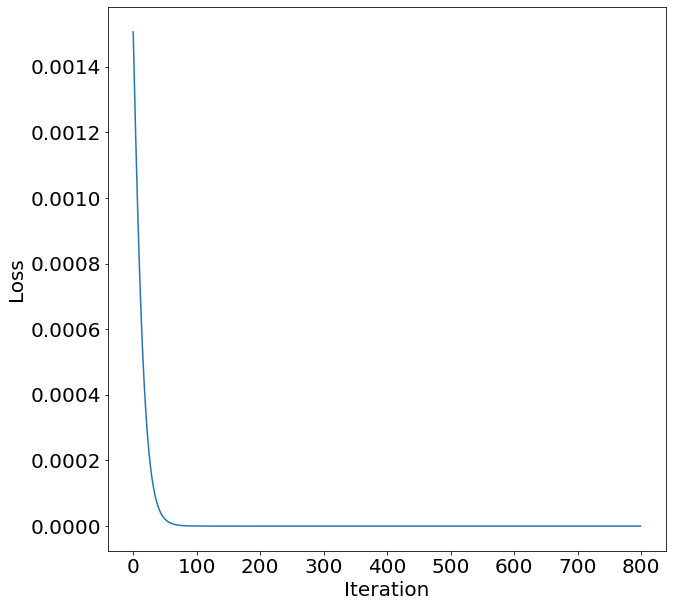

In [52]:
plt.figure(figsize=(10,10))
plt.plot(resx1["loss_list"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

In [53]:
from matplotlib import cm

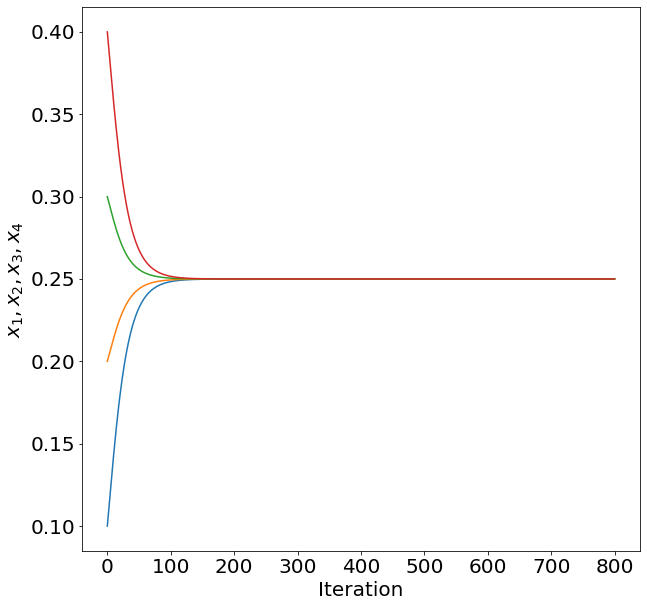

In [54]:
plt.figure(figsize=(10,10))
plt.plot(resx1["points"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('$x_1,x_2,x_3,x_4$',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

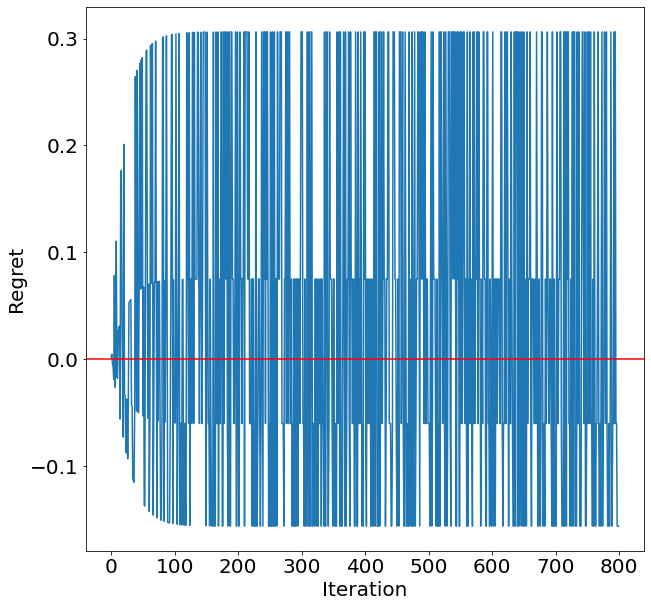

In [55]:
plt.figure(figsize=(10,10))
plt.plot(resx1["regret"])
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

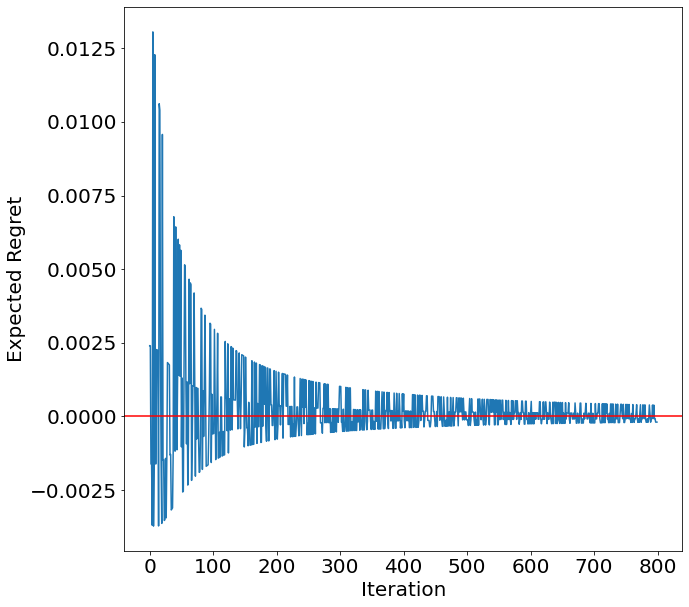

0.0013871737

In [56]:
plt.figure(figsize=(10,10))
reg_exp1=[resx1["regret"][i]/(i+1) for i in range(len(resx1["regret"]))]
plt.plot(reg_exp1)
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Expected Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

np.std(reg_exp1)

In [57]:
x1=np.array([0.1,0.2,0.3,0.4])
n=800
eta0=3
resx2=exp_adv2(x1,l,n,eta0)

[0.10440146 0.20141969 0.29852567 0.39565317]
[0.10881898 0.20284772 0.29704606 0.39128724]
[0.1132399  0.20427995 0.29556545 0.3869147 ]
[0.11765184 0.20571237 0.29408799 0.38254779]
[0.1220428  0.20714103 0.29261775 0.37819842]
[0.12640127 0.2085621  0.29115862 0.373878  ]
[0.1307164  0.20997195 0.28971423 0.36959741]
[0.13497806 0.21136714 0.28828803 0.36536677]
[0.13917691 0.21274448 0.28688314 0.36119548]
[0.14330447 0.21410105 0.28550236 0.35709212]
[0.14735316 0.2154342  0.28414832 0.35306431]
[0.15131633 0.21674155 0.28282319 0.34911893]
[0.15518821 0.21802106 0.28152889 0.34526185]
[0.15896392 0.21927092 0.28026708 0.34149808]
[0.16263948 0.22048962 0.27903911 0.33783179]
[0.1662117  0.22167594 0.277846   0.33426636]
[0.1696782  0.2228289  0.27668854 0.33080436]
[0.17303728 0.2239478  0.27556728 0.32744764]
[0.17628795 0.22503211 0.27448252 0.32419742]
[0.17942981 0.22608156 0.27343438 0.32105425]
[0.18246302 0.227096   0.27242279 0.31801818]
[0.1853882  0.22807557 0.27144753 

[0.24996598 0.24998828 0.25001121 0.25003453]
[0.24996758 0.24998883 0.25001069 0.2500329 ]
[0.2499691  0.24998935 0.25001018 0.25003137]
[0.24997053 0.24998985 0.25000971 0.2500299 ]
[0.24997192 0.24999032 0.25000925 0.2500285 ]
[0.24997324 0.24999076 0.25000883 0.25002717]
[0.24997449 0.24999119 0.25000841 0.2500259 ]
[0.2499757  0.2499916  0.25000802 0.25002468]
[0.24997682 0.24999201 0.25000764 0.25002353]
[0.24997791 0.24999239 0.25000728 0.25002243]
[0.24997894 0.24999274 0.25000695 0.25002136]
[0.24997994 0.24999306 0.25000664 0.25002037]
[0.24998086 0.24999338 0.25000633 0.25001944]
[0.24998174 0.2499937  0.25000603 0.25001853]
[0.24998261 0.24999399 0.25000575 0.25001766]
[0.24998341 0.24999428 0.25000547 0.25001684]
[0.24998418 0.24999457 0.25000519 0.25001605]
[0.24998492 0.24999483 0.25000497 0.25001529]
[0.24998563 0.24999505 0.25000474 0.25001457]
[0.24998632 0.24999528 0.25000451 0.25001389]
[0.24998696 0.2499955  0.25000431 0.25001323]
[0.24998757 0.24999571 0.25000411 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

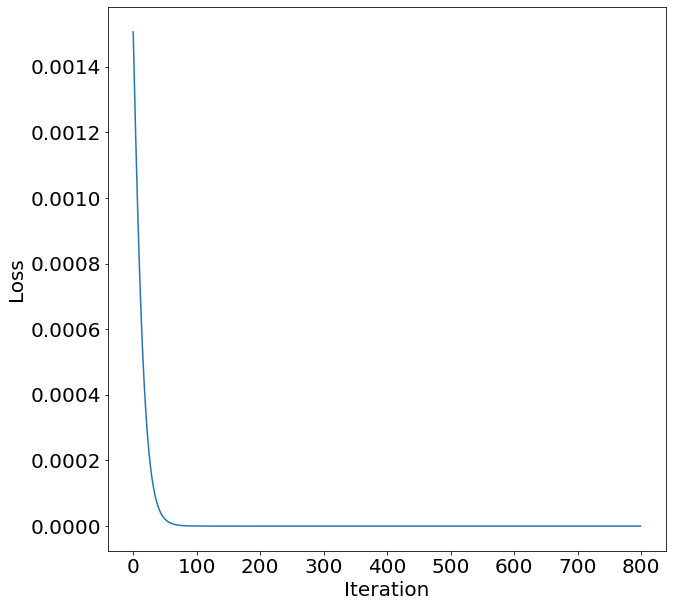

In [58]:
plt.figure(figsize=(10,10))
plt.plot(resx2["loss_list"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

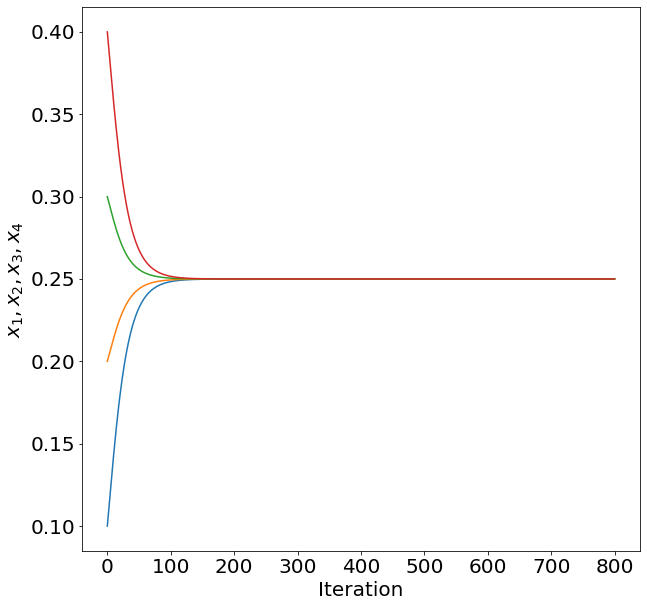

In [59]:
plt.figure(figsize=(10,10))
plt.plot(resx2["points"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('$x_1,x_2,x_3,x_4$',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

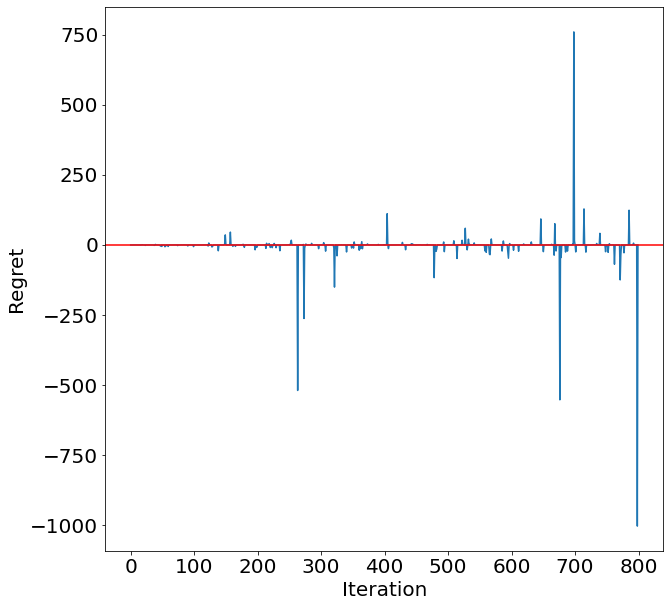

In [60]:
plt.figure(figsize=(10,10))
plt.plot(resx2["regret"])
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

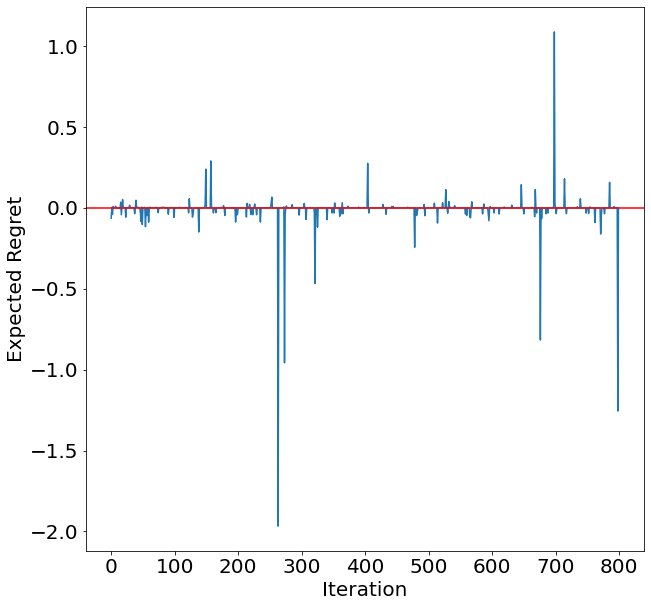

0.10636437

In [61]:
plt.figure(figsize=(10,10))
reg_exp2=[resx2["regret"][i]/(i+1) for i in range(len(resx2["regret"]))]
plt.plot(reg_exp2)
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Expected Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

np.std(reg_exp2)

In [24]:
x1=np.array([0.1,0.2,0.3,0.4])
n=800
eta0=3
resx3=exp_adv3(x1,l,n,eta0)

[0.10440146 0.20141969 0.29852567 0.39565317]
[0.10881898 0.20284772 0.29704606 0.39128724]
[0.1132399  0.20427995 0.29556545 0.3869147 ]
[0.11765184 0.20571237 0.29408799 0.38254779]
[0.1220428  0.20714103 0.29261775 0.37819842]
[0.12640127 0.2085621  0.29115862 0.373878  ]
[0.1307164  0.20997195 0.28971423 0.36959741]
[0.13497806 0.21136714 0.28828803 0.36536677]
[0.13917691 0.21274448 0.28688314 0.36119548]
[0.14330447 0.21410105 0.28550236 0.35709212]
[0.14735316 0.2154342  0.28414832 0.35306431]
[0.15131633 0.21674155 0.28282319 0.34911893]
[0.15518821 0.21802106 0.28152889 0.34526185]
[0.15896392 0.21927092 0.28026708 0.34149808]
[0.16263948 0.22048962 0.27903911 0.33783179]
[0.1662117  0.22167594 0.277846   0.33426636]
[0.1696782  0.2228289  0.27668854 0.33080436]
[0.17303728 0.2239478  0.27556728 0.32744764]
[0.17628795 0.22503211 0.27448252 0.32419742]
[0.17942981 0.22608156 0.27343438 0.32105425]
[0.18246302 0.227096   0.27242279 0.31801818]
[0.1853882  0.22807557 0.27144753 

[0.24996758 0.24998883 0.25001069 0.2500329 ]
[0.2499691  0.24998935 0.25001018 0.25003137]
[0.24997053 0.24998985 0.25000971 0.2500299 ]
[0.24997192 0.24999032 0.25000925 0.2500285 ]
[0.24997324 0.24999076 0.25000883 0.25002717]
[0.24997449 0.24999119 0.25000841 0.2500259 ]
[0.2499757  0.2499916  0.25000802 0.25002468]
[0.24997682 0.24999201 0.25000764 0.25002353]
[0.24997791 0.24999239 0.25000728 0.25002243]
[0.24997894 0.24999274 0.25000695 0.25002136]
[0.24997994 0.24999306 0.25000664 0.25002037]
[0.24998086 0.24999338 0.25000633 0.25001944]
[0.24998174 0.2499937  0.25000603 0.25001853]
[0.24998261 0.24999399 0.25000575 0.25001766]
[0.24998341 0.24999428 0.25000547 0.25001684]
[0.24998418 0.24999457 0.25000519 0.25001605]
[0.24998492 0.24999483 0.25000497 0.25001529]
[0.24998563 0.24999505 0.25000474 0.25001457]
[0.24998632 0.24999528 0.25000451 0.25001389]
[0.24998696 0.2499955  0.25000431 0.25001323]
[0.24998757 0.24999571 0.25000411 0.25001261]
[0.24998814 0.24999591 0.25000392 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 0.25000024]
[0.2499996  0.24999992 0.25000025 

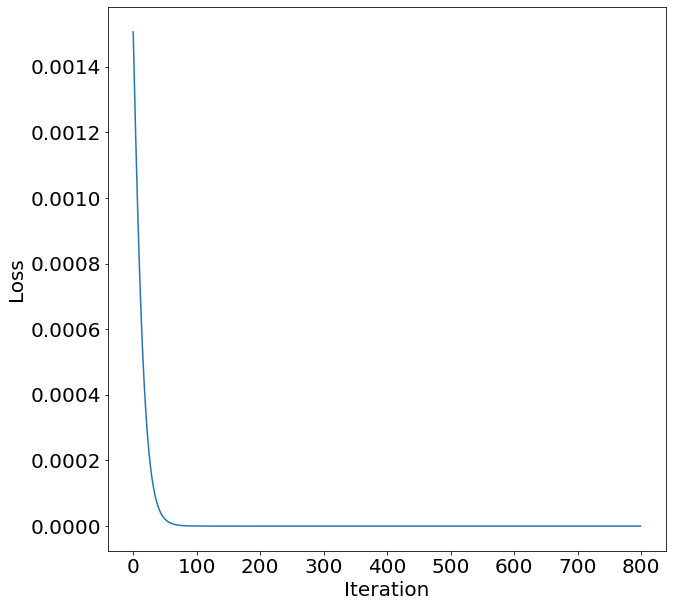

In [25]:
plt.figure(figsize=(10,10))
plt.plot(resx3["loss_list"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

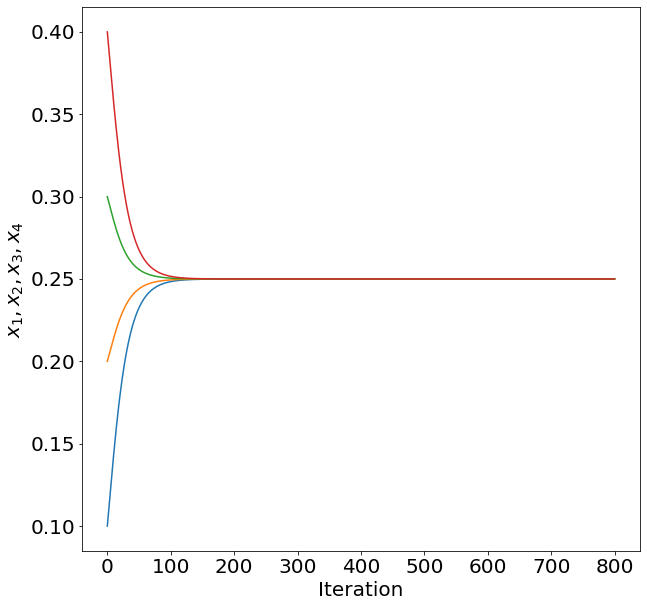

In [26]:
plt.figure(figsize=(10,10))
plt.plot(resx3["points"])
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('$x_1,x_2,x_3,x_4$',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

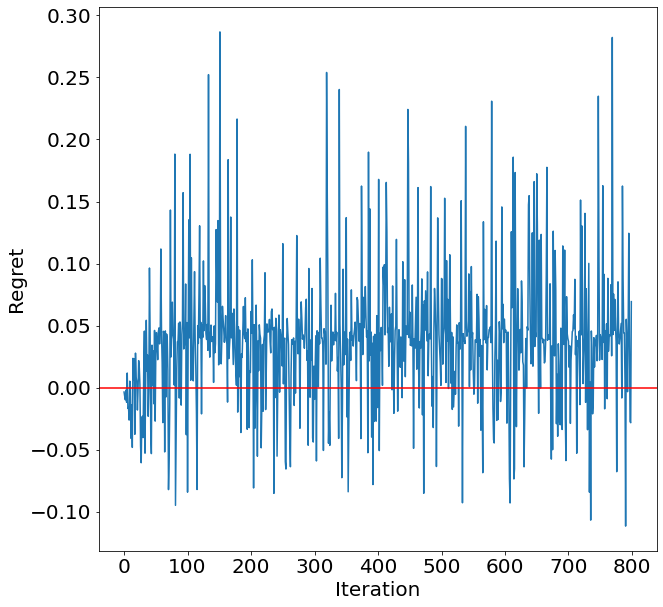

In [27]:
plt.figure(figsize=(10,10))
plt.plot(resx3["regret"])
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()

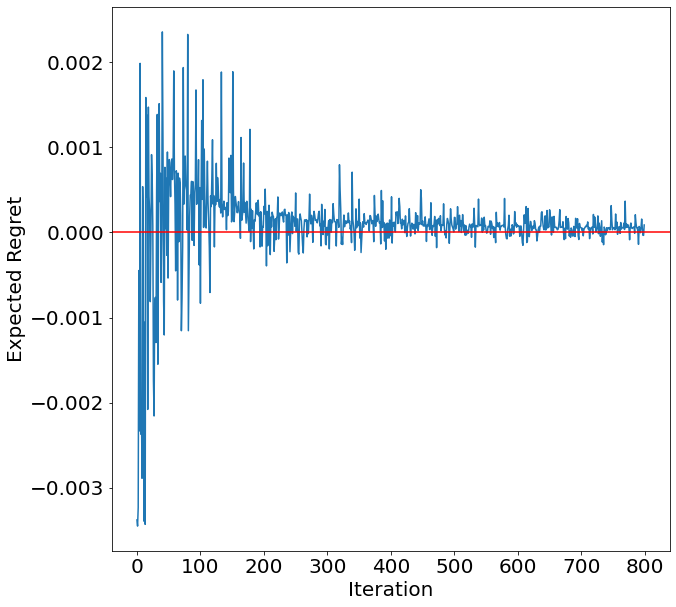

0.0004929537

In [28]:
plt.figure(figsize=(10,10))
reg_exp3=[resx3["regret"][i]/(i+1) for i in range(len(resx3["regret"]))]
plt.plot(reg_exp3)
plt.axhline(y = 0., color = 'r')
plt.xlabel('Iteration',fontsize=20)
plt.ylabel('Expected Regret',fontsize=20)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.show()
np.std(reg_exp3)